In [1]:
from pyrosm import OSM
import pyrosm
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from shapely.geometry import box
import numpy as np
import math

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.offsetbox import AnchoredText
from matplotlib.font_manager import FontProperties

In [ ]:
#read data
data_path="osm-files"
water_sea = gpd.read_file(f"{data_path}/water-polygons-split-4326/water_polygons.shp")
osm_file=f"{data_path}/helsinki.osm.pbf"
#osm_file=f"{data_path}/karlsruhe.osm.pbf"
osm = OSM(osm_file)
gdf_streets = osm.get_network(network_type="all")
gdf_land=osm.get_boundaries()
gdf_buildings=osm.get_buildings()
gdf_landuse=osm.get_landuse()

rails = ["tramway", "light_rail", "rail", "subway", "tram"]
gdf_rails = osm.get_data_by_custom_criteria(custom_filter={

                                        'railway': rails},
                                        # Keep data matching the criteria above
                                        filter_type="keep",
                                        # Do not keep nodes (point data)    
                                        keep_nodes=False, 
                                        keep_ways=True, 
                                        keep_relations=True)



# Clip land to your area
minx, miny, maxx, maxy = gdf_streets.total_bounds
bbox_gdf = gpd.GeoDataFrame(
    geometry=[box(minx, miny, maxx, maxy)],
    crs=gdf_streets.crs
)
water_local = water_sea.clip(bbox_gdf)


c:\Users\jojob\miniconda3\envs\osm\lib\site-packages\pyrosm\networks.py:37: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  edges, nodes = prepare_geodataframe(


In [24]:
water_areas = osm.get_data_by_custom_criteria(
    custom_filter={"natural": ["water"]},
    keep_nodes=False
)
waterways = osm.get_data_by_custom_criteria(
    custom_filter={"waterway": True},
    keep_nodes=False
)
coastline = osm.get_data_by_custom_criteria(
    custom_filter={"natural": ["coastline"]},
    keep_nodes=False
)
wetlands = osm.get_data_by_custom_criteria(
    custom_filter={"natural": ["wetland"]},
    keep_nodes=False
)


c:\Users\jojob\miniconda3\envs\osm\lib\site-packages\pyrosm\pyrosm.py:767: UserWarning: Could not find any OSM data for given area.
  gdf = get_user_defined_data(


In [20]:
def plot_map(bottom_left_corner=[24.75, 60.14], height=0.09, has_sea=True, include_buildings=False, water_attributes=[water_areas, wetlands], background="white", point=None,city="", country="", filename=""):
    water = gpd.GeoDataFrame(
        pd.concat(water_attributes, ignore_index=True), #[water_areas, waterways, wetlands, coastline]
        crs=water_areas.crs )

    x,y=(16.53, 11.69) # A3 paper (inches) - edit this line  to change the format of the map
    fig, ax = plt.subplots(figsize=(x,y))
    #hide axis labels
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    
    #width=0.25
    width=height*(x/y)/np.cos(math.radians(bottom_left_corner[1]))
    print(width)
    ax.set_xlim(bottom_left_corner[0], bottom_left_corner[0]+width)
    ax.set_ylim(bottom_left_corner[1], bottom_left_corner[1]+height)
    ax.set_facecolor(background)


    water.plot(ax=ax, color='lightblue')
    if(has_sea):
        water_local.plot(ax=ax, color='lightblue')
    gdf_streets.plot(ax=ax, color='black', linewidth=0.3)
    gdf_rails.plot(ax=ax, color='black', linewidth=0.3)
    if(include_buildings):
        gdf_buildings.plot(ax=ax, color='grey')

    if (point is not None):
        ax.plot(point[0], point[1], marker='o', color='red', markersize=15)

    ax.set_position([0, 0, 1, 1])
    ax.set_aspect('auto')
    
    #label - edit this part to change the title/subtitle style
    # --- Box ---
    box_width =0.25
    box_height = 0.12
    x_1 = 0.5 - box_width/2 #1 - box_width -0.02 - bottom right
    y_1 = 0.02

    rect = Rectangle(
        (x_1, y_1),
        box_width,
        box_height,
        transform=ax.transAxes,
        facecolor="white",
        edgecolor="black",
        zorder=2
    )
    ax.add_patch(rect)

    # --- Fonts ---
    header_font = FontProperties(family="serif", size=25, weight="bold")
    subheader_font = FontProperties(family="serif", size=20)

    # --- Center of the box ---
    cx = x_1 + box_width / 2
    cy = y_1 + box_height / 2

    # --- Text ---
    ax.text(
        cx,
        cy + 0.025,
        city,
        transform=ax.transAxes,
        fontproperties=header_font,
        ha="center",
        va="center",
        zorder=3
    )

    ax.text(
        cx,
        cy - 0.025,
        country,
        transform=ax.transAxes,
        fontproperties=subheader_font,
        ha="center",
        va="center",
        zorder=3
    )


    if(filename!=""):
        fig.savefig(f"{filename}.png", dpi=400)#, bbox_inches="tight")
        fig.savefig(f"{filename}.pdf")

    

0.2556077800879684


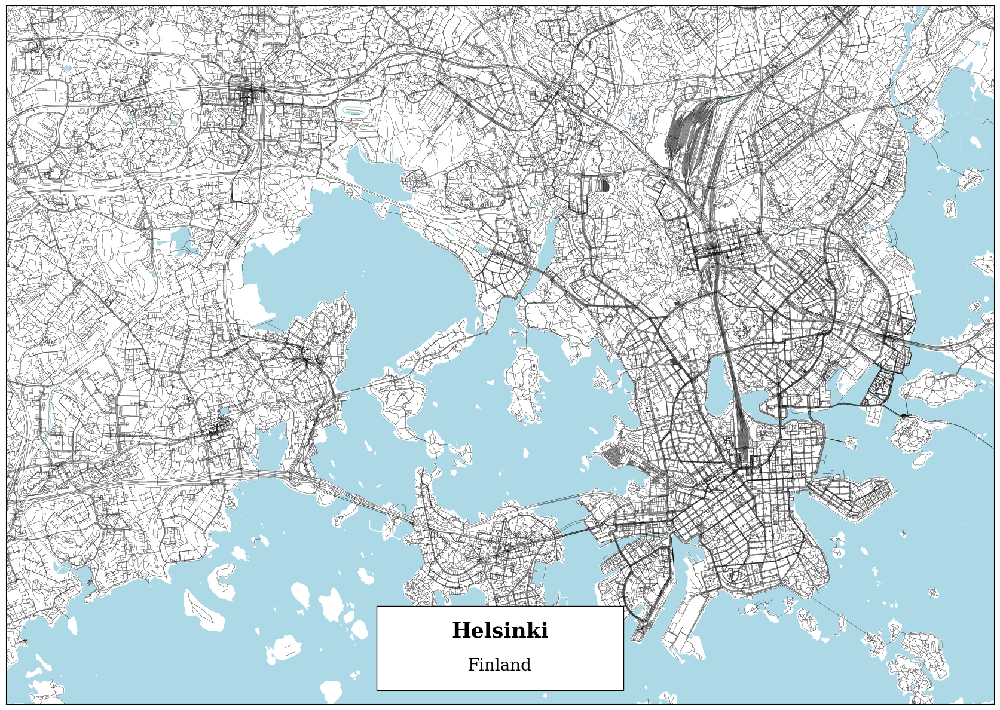

In [21]:
#helsinki
plot_map(bottom_left_corner=[24.75, 60.14], height=0.09, has_sea=True, water_attributes=[water_areas, wetlands], city="Helsinki", country="Finland", filename="results/helsinki")

0.2556077800879684


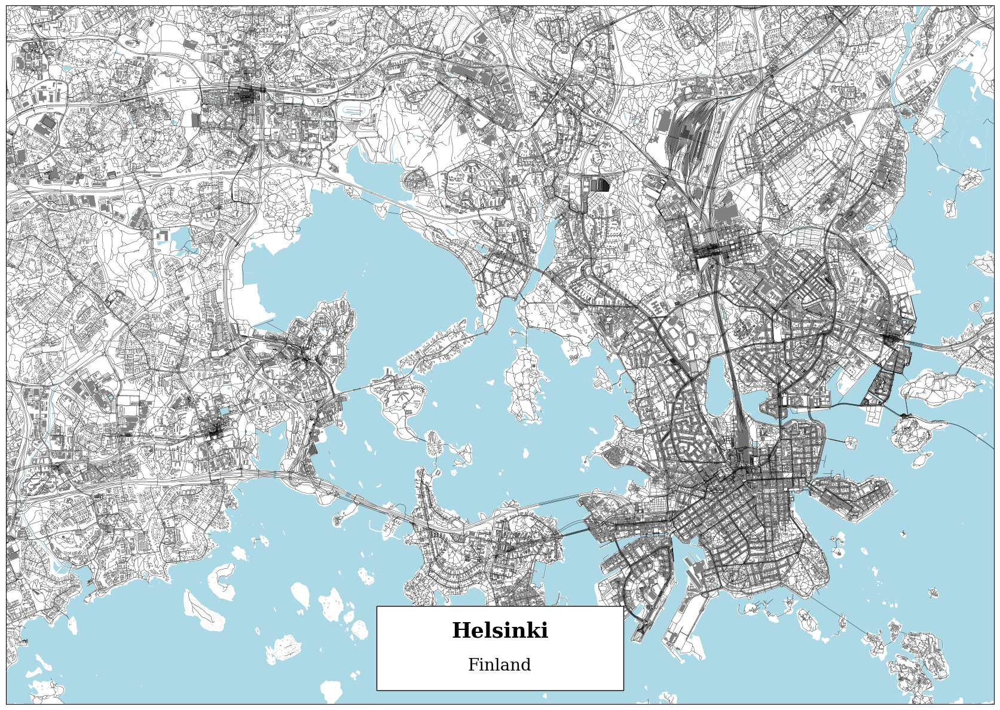

In [22]:
# with buildings
plot_map(bottom_left_corner=[24.75, 60.14], height=0.09, has_sea=True, water_attributes=[water_areas, wetlands], city="Helsinki", country="Finland", include_buildings=True, filename="results/helsinki_buildings")

0.12926055944351067


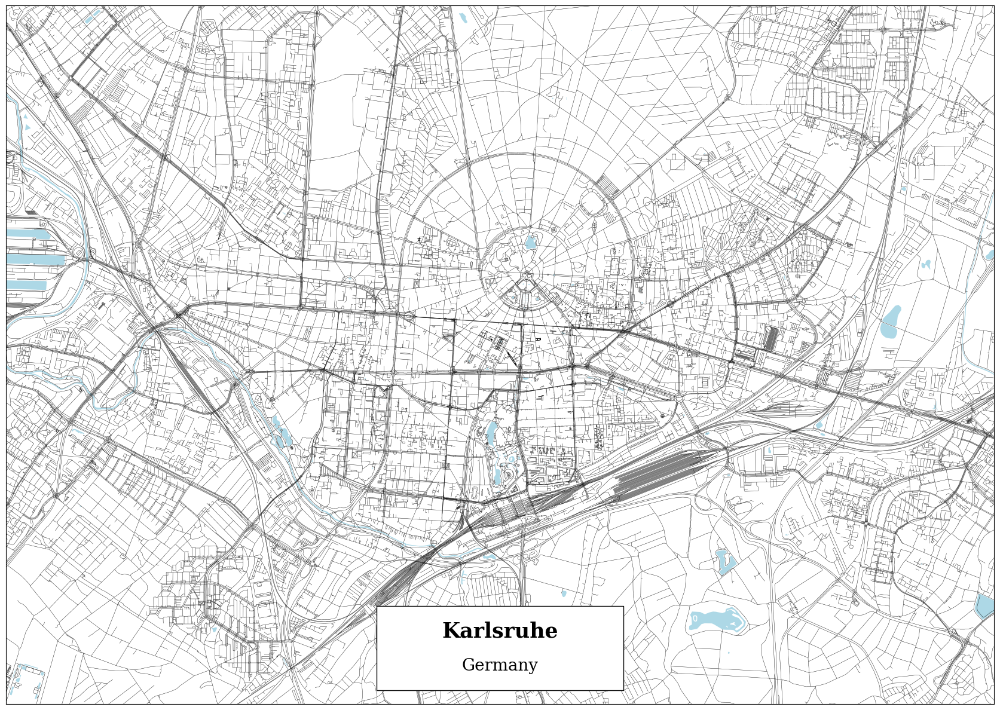

In [27]:
#karlsruhe (important: change the osm_file at the beginning of the code to karlsruhe.osm.pbf)
plot_map(bottom_left_corner=[8.33626, 48.97698], height=0.06, has_sea=False, water_attributes=[water_areas, wetlands], include_buildings=False, city="Karlsruhe", country="Germany", filename="results/karlsruhe")

0.12926055944351067


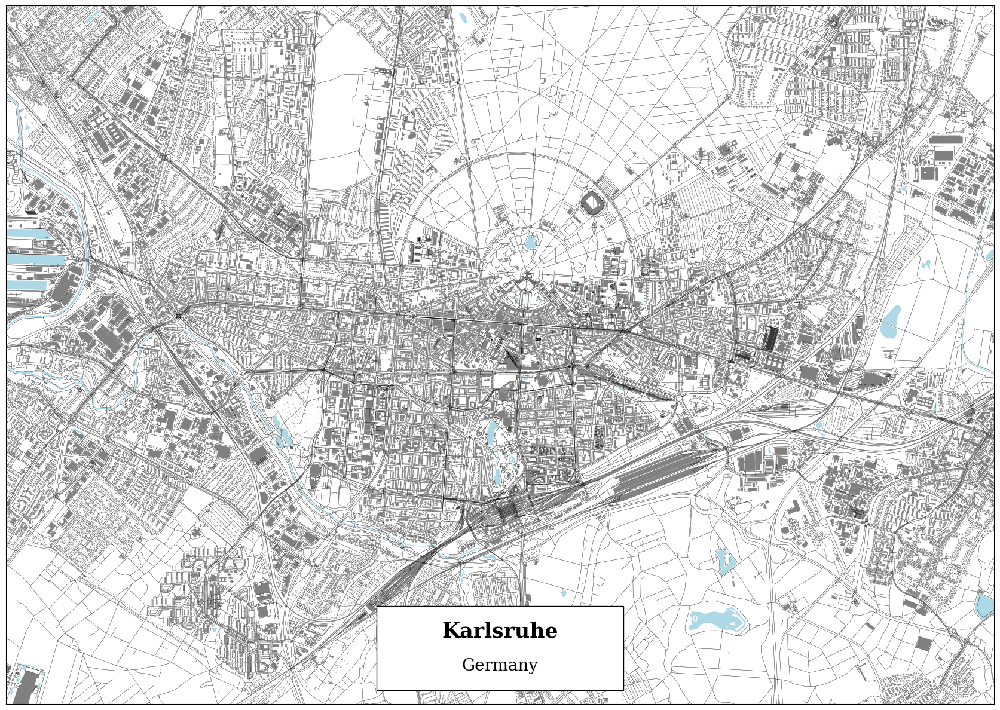

In [28]:
#karlsruhe with buildings
plot_map(bottom_left_corner=[8.33626, 48.97698], height=0.06, has_sea=False, water_attributes=[water_areas, wetlands], include_buildings=True, city="Karlsruhe", country="Germany", filename="results/karlsruhe_buildings")